In [1]:
import numpy as np
import pandas as pd
pd.set_option("max_rows", 500, "max_colwidth", 500, "max_columns", 500, "display.unicode.east_asian_width", True)
# google colabで使う場合は↓がエラーになるので必須 => pip install -U plotly pandas
pd.options.plotting.backend = "plotly"
pd.options.display.float_format = "{:.3f}".format # 小数点第3位まで
import plotly.express as px # pandas-plotでできない時
import plotly.figure_factory as ff

def load_data(file_path: str, **kwargs):
    df = pd.read_csv(file_path, **kwargs)
    print(df.shape)
    print(df.info())
    print(df.isnull().sum())
    return df

## レシート

In [2]:
df_receipt = load_data(
    "./data/receipt.csv",
    dtype={"receipt_no": "str", "receipt_sub_no": "str"},
    parse_dates=["sales_ymd"])
df_receipt.head()

(104681, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104681 entries, 0 to 104680
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   sales_ymd       104681 non-null  datetime64[ns]
 1   sales_epoch     104681 non-null  int64         
 2   store_cd        104681 non-null  object        
 3   receipt_no      104681 non-null  object        
 4   receipt_sub_no  104681 non-null  object        
 5   customer_id     104681 non-null  object        
 6   product_cd      104681 non-null  object        
 7   quantity        104681 non-null  int64         
 8   amount          104681 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(5)
memory usage: 7.2+ MB
None
sales_ymd         0
sales_epoch       0
store_cd          0
receipt_no        0
receipt_sub_no    0
customer_id       0
product_cd        0
quantity          0
amount            0
dtype: int64


,sales_ymd,sales_epoch,store_cd,receipt_no,receipt_sub_no,customer_id,product_cd,quantity,amount
0,2018-11-03,1541203200,S14006,112,1,CS006214000001,P070305012,1,158
1,2018-11-18,1542499200,S13008,1132,2,CS008415000097,P070701017,1,81
2,2017-07-12,1499817600,S14028,1102,1,CS028414000014,P060101005,1,170
3,2019-02-05,1549324800,S14042,1132,1,ZZ000000000000,P050301001,1,25
4,2018-08-21,1534809600,S14025,1102,2,CS025415000050,P060102007,1,90


In [3]:
df_receipt.describe(include="all")

/var/folders/_r/nkqpvn3j67q5y6jwsxjgx7j00000gn/T/ipykernel_1892/3224908535.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_receipt.describe(include="all")


,sales_ymd,sales_epoch,store_cd,receipt_no,receipt_sub_no,customer_id,product_cd,quantity,amount
count,104681,104681.000,104681,104681,104681,104681,104681,104681.000,104681.000
unique,1034,NaN,52,81,2,8307,7823,NaN,NaN
top,2018-02-28 00:00:00,NaN,S13018,1112,2,ZZ000000000000,P060303001,NaN,NaN
freq,188,NaN,2530,9691,52430,38999,3028,NaN,NaN
first,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2019-10-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1529803327.427,NaN,NaN,NaN,NaN,NaN,1.011,320.560
std,NaN,25809159.246,NaN,NaN,NaN,NaN,NaN,0.114,477.703
min,NaN,1483228800.000,NaN,NaN,NaN,NaN,NaN,1.000,10.000
25%,NaN,1507680000.000,NaN,NaN,NaN,NaN,NaN,1.000,102.000


In [4]:
df_receipt.drop(columns=["sales_epoch", "receipt_no", "receipt_sub_no"], inplace=True)

## 顧客データ

In [7]:
df_customer = load_data("./data/customer.csv", parse_dates=["application_date"])
df_customer.head()

(21971, 11)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21971 entries, 0 to 21970
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   customer_id           21971 non-null  object        
 1   customer_name         21971 non-null  object        
 2   gender_cd             21971 non-null  int64         
 3   gender                21971 non-null  object        
 4   birth_day             21971 non-null  object        
 5   age                   21971 non-null  int64         
 6   postal_cd             21971 non-null  object        
 7   address               21971 non-null  object        
 8   application_store_cd  21971 non-null  object        
 9   application_date      21971 non-null  datetime64[ns]
 10  status_cd             21971 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(8)
memory usage: 1.8+ MB
None
customer_id             0
customer_name           0

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,2015-09-05,0-00000000-0
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,2015-04-14,0-00000000-0
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,2015-05-29,D-20100325-C
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,2016-01-15,0-00000000-0
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,2017-06-05,6-20090929-2


In [8]:
df_customer.describe(include="all")

/var/folders/_r/nkqpvn3j67q5y6jwsxjgx7j00000gn/T/ipykernel_1892/1948785472.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_customer.describe(include="all")


,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd
count,21971,21971,21971.000,21971,21971,21971.000,21971,21971,21971,21971,21971
unique,21971,18689,NaN,3,12759,NaN,1239,1235,53,1574,7021
top,CS021313000114,紺野 花,NaN,女性,1976-09-06,NaN,144-0056,東京都大田区西六郷**********,S13001,2015-06-16 00:00:00,0-00000000-0
freq,1,7,NaN,17918,8,NaN,298,298,1339,69,13665
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013-12-03 00:00:00,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-03-25 00:00:00,NaN
mean,NaN,NaN,1.255,NaN,NaN,50.745,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,1.787,NaN,NaN,14.564,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,0.000,NaN,NaN,11.000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,1.000,NaN,NaN,41.000,NaN,NaN,NaN,NaN,NaN


In [9]:
df_customer.query("customer_name == '紺野 花'")

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd
452,CS013615000047,紺野 花,1,女性,1949-03-27,70,275-0021,千葉県習志野市袖ケ浦**********,S12013,2015-01-10,B-20090629-6
2727,CS003314000034,紺野 花,1,女性,1981-12-24,37,201-0001,東京都狛江市西野川**********,S13003,2015-08-06,3-20080426-2
8541,CS015513000023,紺野 花,1,女性,1962-07-09,56,136-0076,東京都江東区南砂**********,S13015,2015-09-30,5-20091005-9
9975,CS019615000099,紺野 花,1,女性,1952-01-16,67,179-0084,東京都練馬区氷川台**********,S13019,2015-04-16,0-00000000-0
15419,CS012513000105,紺野 花,9,不明,1962-02-06,57,231-0833,神奈川県横浜市中区本牧満坂**********,S14012,2015-01-09,5-20100118-7
19190,CS023211000004,紺野 花,1,女性,1992-10-30,26,144-0056,東京都大田区西六郷**********,S14023,2015-12-12,4-20081211-2
19469,CS004313000327,紺野 花,1,女性,1985-02-05,34,165-0032,東京都中野区鷺宮**********,S13004,2016-10-10,0-00000000-0


In [10]:
#df_customer["past_days"]
pd.Timestamp(year=2019, month=11, day=1) - df_customer.application_date

0       1518 days
1       1662 days
2       1617 days
3       1386 days
4        879 days
           ...   
21966    721 days
21967   1694 days
21968   1670 days
21969   1364 days
21970   1652 days
Name: application_date, Length: 21971, dtype: timedelta64[ns]

In [11]:
pd.Timedelta(days=90) == pd.Timedelta(90, "days")

True

In [12]:
# 30件の重複あり => 申し込むと〇〇キャンペーンなどで複数店舗で登録した？
df_customer.loc[df_customer.duplicated(subset=["customer_name", "postal_cd"], keep=False)].sort_values("customer_name")

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd
2013,CS016712000025,久野 みゆき,1,女性,1960-08-22,58,144-0052,東京都大田区蒲田**********,S13016,2015-06-27,0-00000000-0
15632,CS001515000422,久野 みゆき,1,女性,1960-08-22,58,144-0052,東京都大田区蒲田**********,S13001,2016-07-03,7-20100517-7
21698,CS040601000007,今 充則,0,男性,1949-04-09,69,246-0001,神奈川県横浜市瀬谷区卸本町**********,S14040,2015-03-08,0-00000000-0
13423,CS038214000037,今 充則,0,男性,1949-04-09,69,246-0001,神奈川県横浜市瀬谷区卸本町**********,S13038,2018-05-14,0-00000000-0
3731,CS001515000561,伴 芽以,1,女性,1959-06-24,59,144-0051,東京都大田区西蒲田**********,S13001,2017-03-17,A-20091210-8
4900,CS004712000149,伴 芽以,1,女性,1959-06-24,59,144-0051,東京都大田区西蒲田**********,S13004,2017-01-28,0-00000000-0
20428,CS002615000172,前田 美紀,1,女性,1957-10-05,61,185-0022,東京都国分寺市東元町**********,S13002,2016-07-10,0-00000000-0
11925,CS002215000052,前田 美紀,1,女性,1989-12-17,29,185-0022,東京都国分寺市東元町**********,S13002,2014-12-18,6-20100416-7
3271,CS018413000015,原 優,1,女性,1977-08-31,41,166-0003,東京都杉並区高円寺南**********,S13018,2015-05-02,0-00000000-0
17253,CS017414000126,原 優,1,女性,1977-08-31,41,166-0003,東京都杉並区高円寺南**********,S13017,2016-05-06,8-20100821-A


In [60]:
df_customer["generation"] = (df_customer.age // 10 * 10).astype("str") + "代"
df_customer.head()

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,2015-09-05,0-00000000-0,30代
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,2015-04-14,0-00000000-0,60代
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,2015-05-29,D-20100325-C,40代
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,2016-01-15,0-00000000-0,80代
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,2017-06-05,6-20090929-2,20代


In [61]:
pd.crosstab(index=df_customer.generation, columns=df_customer.gender)

gender,不明,女性,男性
generation,,,
10代,9,144,15
20代,52,1032,110
30代,188,3134,424
40代,288,4876,759
50代,280,4347,798
60代,148,2531,474
70代,93,1479,309
80代,14,370,90
90代,0,5,2


In [62]:
ff.create_annotated_heatmap(
    cs_cross.values.tolist(),
    x=cs_cross.columns.to_list(),
    y=cs_cross.index.to_list(),
    colorscale=[[0, "lightgray"], [1, "#CC3299"]],
    font_colors=["white"]
)

NameError: name 'cs_cross' is not defined

In [63]:
df_customer.address.str[:3].value_counts()

東京都    11928
神奈川     7642
千葉県     2346
埼玉県       55
Name: address, dtype: int64

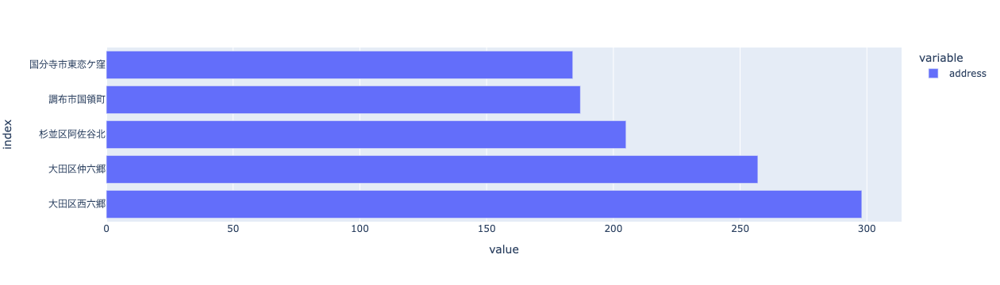

In [64]:
df_customer.query("address.str.contains('東京都')").address.str[3:].str.replace("\*", "", regex=True).value_counts().head().plot.barh()

In [65]:
# Zで始まる顧客はいない -> 退会顧客は
df_customer.loc[df_customer.customer_id.str.startswith("Z")]

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation


## 商品カテゴリデータ

In [13]:
df_category = load_data("./data/category.csv", dtype="str")
df_category.head()

(228, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228 entries, 0 to 227
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   category_major_cd     228 non-null    object
 1   category_major_name   228 non-null    object
 2   category_medium_cd    228 non-null    object
 3   category_medium_name  228 non-null    object
 4   category_small_cd     228 non-null    object
 5   category_small_name   228 non-null    object
dtypes: object(6)
memory usage: 10.8+ KB
None
category_major_cd       0
category_major_name     0
category_medium_cd      0
category_medium_name    0
category_small_cd       0
category_small_name     0
dtype: int64


,category_major_cd,category_major_name,category_medium_cd,category_medium_name,category_small_cd,category_small_name
0,04,惣菜,0401,御飯類,040101,弁当類
1,04,惣菜,0401,御飯類,040102,寿司類
2,04,惣菜,0402,佃煮類,040201,魚介佃煮類
3,04,惣菜,0402,佃煮類,040202,海草佃煮類
4,04,惣菜,0402,佃煮類,040203,野菜佃煮類


In [14]:
df_category.describe(include="all")

,category_major_cd,category_major_name,category_medium_cd,category_medium_name,category_small_cd,category_small_name
count,228,228,228,228,228,228
unique,6,6,57,56,228,219
top,07,瓶詰缶詰,0703,和風調味料,040101,その他
freq,72,72,10,10,1,9


In [15]:
df_category["category_all_name"] = df_category.category_major_name.str.cat([df_category.category_medium_name, df_category.category_small_name], sep="/")
df_category.head()

,category_major_cd,category_major_name,category_medium_cd,category_medium_name,category_small_cd,category_small_name,category_all_name
0,04,惣菜,0401,御飯類,040101,弁当類,惣菜/御飯類/弁当類
1,04,惣菜,0401,御飯類,040102,寿司類,惣菜/御飯類/寿司類
2,04,惣菜,0402,佃煮類,040201,魚介佃煮類,惣菜/佃煮類/魚介佃煮類
3,04,惣菜,0402,佃煮類,040202,海草佃煮類,惣菜/佃煮類/海草佃煮類
4,04,惣菜,0402,佃煮類,040203,野菜佃煮類,惣菜/佃煮類/野菜佃煮類


In [16]:
df_category = df_category[["category_small_cd", "category_all_name"]]
df_category.head()

,category_small_cd,category_all_name
0,040101,惣菜/御飯類/弁当類
1,040102,惣菜/御飯類/寿司類
2,040201,惣菜/佃煮類/魚介佃煮類
3,040202,惣菜/佃煮類/海草佃煮類
4,040203,惣菜/佃煮類/野菜佃煮類


# 商品データ

In [17]:
df_product = load_data("./data/product.csv", dtype={"category_major_cd": "str", "category_medium_cd": "str", "category_small_cd": "str"})
df_product.head()

(10030, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10030 entries, 0 to 10029
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_cd          10030 non-null  object 
 1   category_major_cd   10030 non-null  object 
 2   category_medium_cd  10030 non-null  object 
 3   category_small_cd   10030 non-null  object 
 4   unit_price          10023 non-null  float64
 5   unit_cost           10023 non-null  float64
dtypes: float64(2), object(4)
memory usage: 470.3+ KB
None
product_cd            0
category_major_cd     0
category_medium_cd    0
category_small_cd     0
unit_price            7
unit_cost             7
dtype: int64


,product_cd,category_major_cd,category_medium_cd,category_small_cd,unit_price,unit_cost
0,P040101001,04,0401,040101,198.000,149.000
1,P040101002,04,0401,040101,218.000,164.000
2,P040101003,04,0401,040101,230.000,173.000
3,P040101004,04,0401,040101,248.000,186.000
4,P040101005,04,0401,040101,268.000,201.000


In [18]:
df_product.describe(include="all")

,product_cd,category_major_cd,category_medium_cd,category_small_cd,unit_price,unit_cost
count,10030,10030,10030,10030,10023.000,10023.000
unique,10030,6,57,228,NaN,NaN
top,P040101001,07,0707,091401,NaN,NaN
freq,1,4065,893,228,NaN,NaN
mean,NaN,NaN,NaN,NaN,402.576,302.189
std,NaN,NaN,NaN,NaN,517.736,389.197
min,NaN,NaN,NaN,NaN,10.000,7.000
25%,NaN,NaN,NaN,NaN,155.000,116.000
50%,NaN,NaN,NaN,NaN,252.000,189.000
75%,NaN,NaN,NaN,NaN,428.000,321.000


In [19]:
df_product[df_product.unit_price.isna()]

,product_cd,category_major_cd,category_medium_cd,category_small_cd,unit_price,unit_cost
159,P040802007,04,0408,040802,NaN,NaN
196,P050103021,05,0501,050103,NaN,NaN
496,P050405009,05,0504,050405,NaN,NaN
1531,P060802026,06,0608,060802,NaN,NaN
2012,P070202092,07,0702,070202,NaN,NaN
6296,P080504027,08,0805,080504,NaN,NaN
7075,P090204185,09,0902,090204,NaN,NaN


In [20]:
df_product["unit_profit"] = df_product.unit_price - df_product.unit_cost
df_product["unit_profit_rate"] = df_product.unit_profit / df_product.unit_price
df_product.head()

,product_cd,category_major_cd,category_medium_cd,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate
0,P040101001,04,0401,040101,198.000,149.000,49.000,0.247
1,P040101002,04,0401,040101,218.000,164.000,54.000,0.248
2,P040101003,04,0401,040101,230.000,173.000,57.000,0.248
3,P040101004,04,0401,040101,248.000,186.000,62.000,0.250
4,P040101005,04,0401,040101,268.000,201.000,67.000,0.250


In [21]:
df_product.drop(columns=["category_major_cd", "category_medium_cd"], inplace=True)
df_product.head()

,product_cd,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate
0,P040101001,040101,198.000,149.000,49.000,0.247
1,P040101002,040101,218.000,164.000,54.000,0.248
2,P040101003,040101,230.000,173.000,57.000,0.248
3,P040101004,040101,248.000,186.000,62.000,0.250
4,P040101005,040101,268.000,201.000,67.000,0.250


In [22]:
df_product = df_product.merge(df_category, how="left", on="category_small_cd")
df_product.head()

,product_cd,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name
0,P040101001,040101,198.000,149.000,49.000,0.247,惣菜/御飯類/弁当類
1,P040101002,040101,218.000,164.000,54.000,0.248,惣菜/御飯類/弁当類
2,P040101003,040101,230.000,173.000,57.000,0.248,惣菜/御飯類/弁当類
3,P040101004,040101,248.000,186.000,62.000,0.250,惣菜/御飯類/弁当類
4,P040101005,040101,268.000,201.000,67.000,0.250,惣菜/御飯類/弁当類


In [23]:
df_product.loc[df_product.unit_price.isna()]

,product_cd,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name
159,P040802007,040802,NaN,NaN,NaN,NaN,惣菜/焼き物/その他やきもの
196,P050103021,050103,NaN,NaN,NaN,NaN,和日配/水物/コンニャク
496,P050405009,050405,NaN,NaN,NaN,NaN,和日配/練物/はんぺん
1531,P060802026,060802,NaN,NaN,NaN,NaN,パン・乳製品/冷菓/プレミアムアイス
2012,P070202092,070202,NaN,NaN,NaN,NaN,瓶詰缶詰/海産乾物/海草類
6296,P080504027,080504,NaN,NaN,NaN,NaN,菓子/駄菓子/その他駄菓子
7075,P090204185,090204,NaN,NaN,NaN,NaN,洗剤/石鹸・シャンプーリンス/シャンプー


In [24]:
df_product["item_name"] = df_product.groupby("category_all_name", group_keys=False).apply(lambda g: g.category_all_name.str.cat(np.arange(len(g)).astype("str"), sep="-"))
df_product.head()

,product_cd,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name,item_name
0,P040101001,040101,198.000,149.000,49.000,0.247,惣菜/御飯類/弁当類,惣菜/御飯類/弁当類-0
1,P040101002,040101,218.000,164.000,54.000,0.248,惣菜/御飯類/弁当類,惣菜/御飯類/弁当類-1
2,P040101003,040101,230.000,173.000,57.000,0.248,惣菜/御飯類/弁当類,惣菜/御飯類/弁当類-2
3,P040101004,040101,248.000,186.000,62.000,0.250,惣菜/御飯類/弁当類,惣菜/御飯類/弁当類-3
4,P040101005,040101,268.000,201.000,67.000,0.250,惣菜/御飯類/弁当類,惣菜/御飯類/弁当類-4


In [25]:
df_product.category_all_name.str.split("/").str[0]

0        惣菜
1        惣菜
2        惣菜
3        惣菜
4        惣菜
         ... 
10025    洗剤
10026    洗剤
10027    洗剤
10028    洗剤
10029    洗剤
Name: category_all_name, Length: 10030, dtype: object

## ストアデータ

In [26]:
df_store = load_data("./data/store.csv", dtype={"prefecture_cd": "str"})
df_store.head()

(53, 10)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   store_cd       53 non-null     object 
 1   store_name     53 non-null     object 
 2   prefecture_cd  53 non-null     object 
 3   prefecture     53 non-null     object 
 4   address        53 non-null     object 
 5   address_kana   53 non-null     object 
 6   tel_no         53 non-null     object 
 7   longitude      53 non-null     float64
 8   latitude       53 non-null     float64
 9   floor_area     53 non-null     float64
dtypes: float64(3), object(7)
memory usage: 4.3+ KB
None
store_cd         0
store_name       0
prefecture_cd    0
prefecture       0
address          0
address_kana     0
tel_no           0
longitude        0
latitude         0
floor_area       0
dtype: int64


,store_cd,store_name,prefecture_cd,prefecture,address,address_kana,tel_no,longitude,latitude,floor_area
0,S12014,千草台店,12,千葉県,千葉県千葉市稲毛区千草台一丁目,チバケンチバシイナゲクチグサダイイッチョウメ,043-123-4003,140.118,35.636,1698.000
1,S13002,国分寺店,13,東京都,東京都国分寺市本多二丁目,トウキョウトコクブンジシホンダニチョウメ,042-123-4008,139.480,35.706,1735.000
2,S14010,菊名店,14,神奈川県,神奈川県横浜市港北区菊名一丁目,カナガワケンヨコハマシコウホククキクナイッチョウメ,045-123-4032,139.633,35.500,1732.000
3,S14033,阿久和店,14,神奈川県,神奈川県横浜市瀬谷区阿久和西一丁目,カナガワケンヨコハマシセヤクアクワニシイッチョウメ,045-123-4043,139.496,35.459,1495.000
4,S14036,相模原中央店,14,神奈川県,神奈川県相模原市中央二丁目,カナガワケンサガミハラシチュウオウニチョウメ,042-123-4045,139.372,35.573,1679.000


In [27]:
df_geocode = load_data("./data/geocode.csv")
df_geocode.head()

(127252, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127252 entries, 0 to 127251
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   postal_cd     127252 non-null  object 
 1   prefecture    127252 non-null  object 
 2   city          127252 non-null  object 
 3   town          125298 non-null  object 
 4   street        1135 non-null    object 
 5   address       7008 non-null    object 
 6   full_address  127252 non-null  object 
 7   longitude     127252 non-null  float64
 8   latitude      127252 non-null  float64
dtypes: float64(2), object(7)
memory usage: 8.7+ MB
None
postal_cd            0
prefecture           0
city                 0
town              1954
street          126117
address         120244
full_address         0
longitude            0
latitude             0
dtype: int64


/var/folders/_r/nkqpvn3j67q5y6jwsxjgx7j00000gn/T/ipykernel_1892/1157046512.py:1: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  df_geocode = load_data("./data/geocode.csv")


,postal_cd,prefecture,city,town,street,address,full_address,longitude,latitude
0,060-0000,北海道,札幌市中央区,NaN,NaN,NaN,北海道札幌市中央区,141.341,43.055
1,064-0941,北海道,札幌市中央区,旭ケ丘,NaN,NaN,北海道札幌市中央区旭ケ丘,141.320,43.042
2,060-0042,北海道,札幌市中央区,大通西,NaN,１丁目,北海道札幌市中央区大通西１丁目,141.356,43.061
3,060-0042,北海道,札幌市中央区,大通西,NaN,２丁目,北海道札幌市中央区大通西２丁目,141.354,43.061
4,060-0042,北海道,札幌市中央区,大通西,NaN,３丁目,北海道札幌市中央区大通西３丁目,141.353,43.061


In [80]:
df_geocode.loc[df_geocode.street.notnull()]

,postal_cd,prefecture,city,town,street,address,full_address,longitude,latitude
79792,602-8134,京都府,京都市上京区,一町目,椹木町通大宮西入,NaN,京都府京都市上京区一町目,135.748,35.021
79793,602-8103,京都府,京都市上京区,一町目,松屋町通下立売上る,NaN,京都府京都市上京区一町目,135.748,35.021
79794,602-8103,京都府,京都市上京区,一町目,松屋町通出水下る,NaN,京都府京都市上京区一町目,135.748,35.021
79795,602-8134,京都府,京都市上京区,一町目,丸太町通大宮東入,NaN,京都府京都市上京区一町目,135.748,35.021
79796,602-8064,京都府,京都市上京区,一町目,上長者町通堀川東入,NaN,京都府京都市上京区一町目,135.748,35.021
...,...,...,...,...,...,...,...,...,...
82953,600-8314,京都府,京都市下京区,若宮町,六条通新町西入,NaN,京都府京都市下京区若宮町,135.766,34.989
82954,600-8314,京都府,京都市下京区,若宮町,新花屋町通若宮東入,NaN,京都府京都市下京区若宮町,135.766,34.989
82955,600-8314,京都府,京都市下京区,若宮町,新花屋町通若宮西入,NaN,京都府京都市下京区若宮町,135.766,34.989
82956,600-8201,京都府,京都市下京区,若宮町,須原通七条下る,NaN,京都府京都市下京区若宮町,135.766,34.989


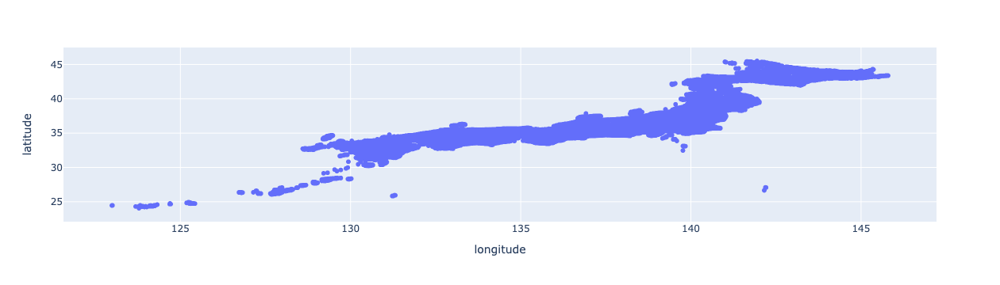

In [81]:
df_geocode.loc[df_geocode.longitude > 0].plot.scatter(x="longitude", y="latitude")

## 結合

In [28]:
df_main = df_receipt.merge(df_product, how="left", on="product_cd")
df_main.head()

,sales_ymd,store_cd,customer_id,product_cd,quantity,amount,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name,item_name
0,2018-11-03,S14006,CS006214000001,P070305012,1,158,070305,158.000,119.000,39.000,0.247,瓶詰缶詰/和風調味料/砂糖・甘味料,瓶詰缶詰/和風調味料/砂糖・甘味料-11
1,2018-11-18,S13008,CS008415000097,P070701017,1,81,070701,81.000,61.000,20.000,0.247,瓶詰缶詰/即席加工品/即席袋めん,瓶詰缶詰/即席加工品/即席袋めん-16
2,2017-07-12,S14028,CS028414000014,P060101005,1,170,060101,170.000,128.000,42.000,0.247,パン・乳製品/パン/食パン,パン・乳製品/パン/食パン-4
3,2019-02-05,S14042,ZZ000000000000,P050301001,1,25,050301,25.000,19.000,6.000,0.240,和日配/生麺/生うどん,和日配/生麺/生うどん-0
4,2018-08-21,S14025,CS025415000050,P060102007,1,90,060102,90.000,63.000,27.000,0.300,パン・乳製品/パン/菓子パン,パン・乳製品/パン/菓子パン-6


In [30]:
df_main.sort_values(by="quantity", ascending=False).head(20)

,sales_ymd,store_cd,customer_id,product_cd,quantity,amount,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name,item_name
47082,2019-06-10,S13037,CS037414000080,P090401002,8,640,090401,80.000,60.000,20.000,0.250,洗剤/衛生紙用品/ティッシュペーパー,洗剤/衛生紙用品/ティッシュペーパー-1
9843,2018-04-14,S13018,CS018205000001,P060104007,6,600,060104,100.000,71.000,29.000,0.290,パン・乳製品/パン/その他パン,パン・乳製品/パン/その他パン-6
21110,2017-06-14,S13018,CS018205000001,P050206001,5,990,050206,198.000,149.000,49.000,0.247,和日配/漬物/味噌漬け,和日配/漬物/味噌漬け-0
88531,2017-12-02,S13043,ZZ000000000000,P060303001,4,592,060303,148.000,105.000,43.000,0.291,パン・乳製品/牛乳/その他牛乳,パン・乳製品/牛乳/その他牛乳-0
63690,2017-07-04,S14033,CS033515000201,P060303001,3,444,060303,148.000,105.000,43.000,0.291,パン・乳製品/牛乳/その他牛乳,パン・乳製品/牛乳/その他牛乳-0
4084,2017-07-24,S14024,CS024414000092,P050102001,3,180,050102,60.000,45.000,15.000,0.250,和日配/水物/油揚げ・がんも,和日配/水物/油揚げ・がんも-0
7724,2017-04-02,S13032,CS032415000202,P060303001,3,444,060303,148.000,105.000,43.000,0.291,パン・乳製品/牛乳/その他牛乳,パン・乳製品/牛乳/その他牛乳-0
76168,2017-02-02,S13004,CS004414000089,P060303001,3,444,060303,148.000,105.000,43.000,0.291,パン・乳製品/牛乳/その他牛乳,パン・乳製品/牛乳/その他牛乳-0
77381,2017-03-04,S13020,CS020513000116,P050101002,3,384,050101,128.000,96.000,32.000,0.250,和日配/水物/豆腐,和日配/水物/豆腐-1
89181,2018-01-27,S13018,CS018512000045,P060101001,3,330,060101,110.000,77.000,33.000,0.300,パン・乳製品/パン/食パン,パン・乳製品/パン/食パン-0


## これまでの売り上げ

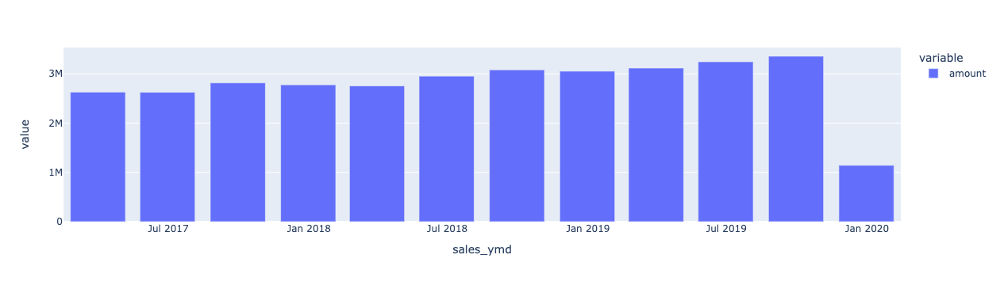

In [31]:
df_main.set_index("sales_ymd").resample("Q").amount.sum().plot.bar()

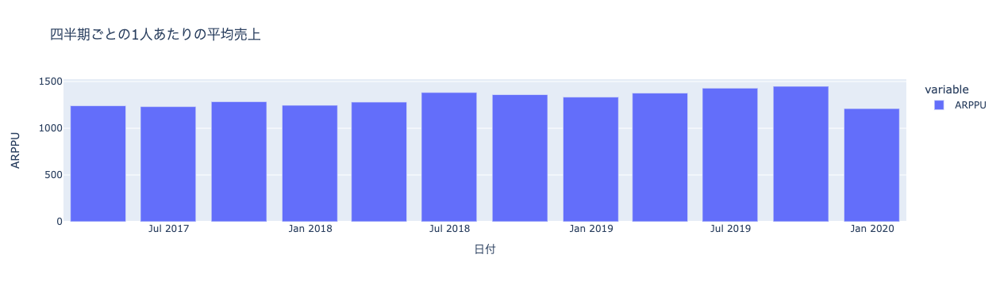

In [32]:
df_sales = df_main.set_index("sales_ymd").resample("Q").agg({"amount": "sum", "customer_id": "nunique"})
df_sales["ARPPU"] = df_sales.amount / df_sales.customer_id
df_sales.ARPPU.plot.bar(title="四半期ごとの1人あたりの平均売上", labels={"sales_ymd": "日付", "value": "ARPPU"})

## 購買数TOPN

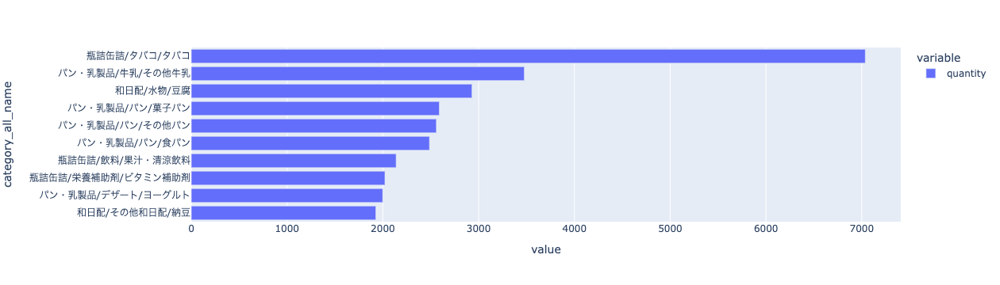

In [33]:
df_main.groupby("category_all_name").quantity.sum().sort_values().tail(10).plot.barh()

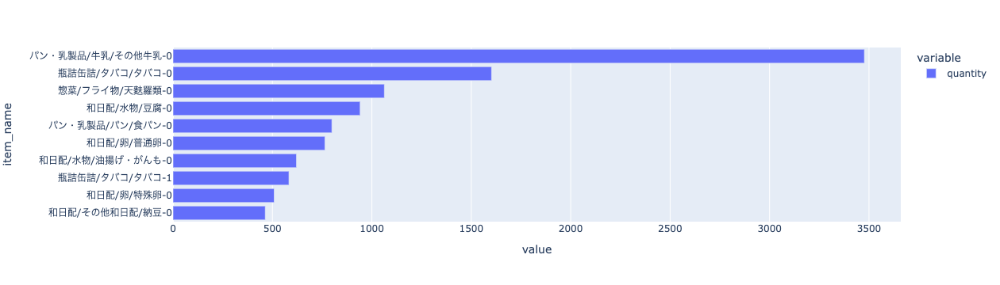

In [34]:
df_main.groupby("item_name").quantity.sum().sort_values().tail(10).plot.barh()

In [35]:
# main_df.pivot_tableでも可能
quantity_cross = pd.crosstab(
    index=df_main.category_all_name,
    columns=df_main.sales_ymd.dt.strftime("%Y年"),
    values=df_main.quantity,
    aggfunc="sum"
)
quantity_cross["合計"] = quantity_cross.sum(axis=1)
quantity_cross.head()

sales_ymd,2017年,2018年,2019年,合計
category_all_name,,,,
パン・乳製品/チルド食品/チルドデザート,88.000,86.000,100.000,274.000
パン・乳製品/チルド食品/チルド半製品,160.000,145.000,165.000,470.000
パン・乳製品/チルド食品/チルド調味料,55.000,53.000,44.000,152.000
パン・乳製品/デザート/その他デザート,136.000,136.000,134.000,406.000
パン・乳製品/デザート/ゼリー,126.000,133.000,121.000,380.000


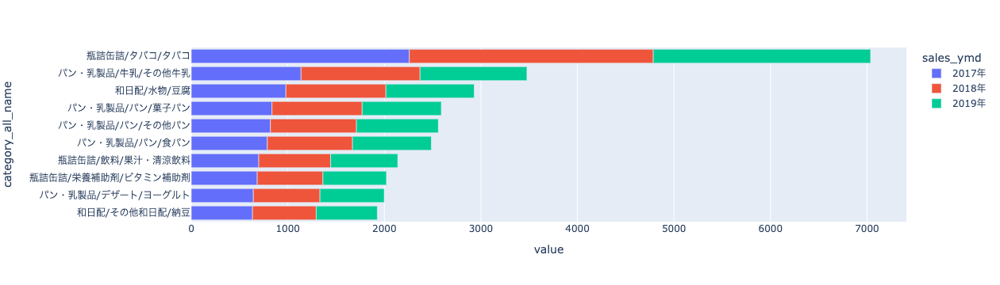

In [36]:
TOPN = 10
quantity_cross.sort_values("合計").tail(TOPN).drop(columns="合計").plot.barh()

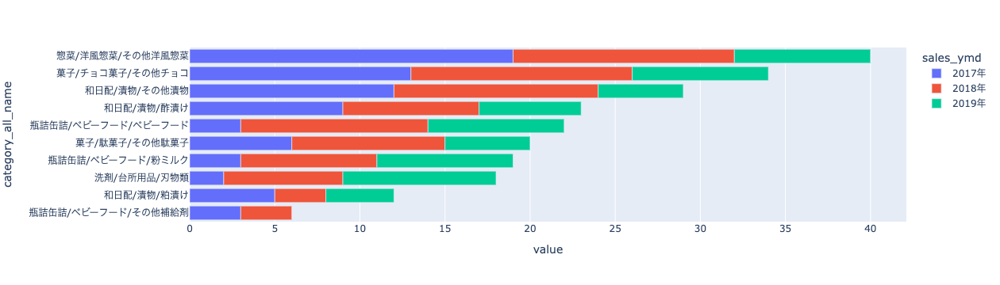

In [37]:
quantity_cross.sort_values("合計").head(TOPN).drop(columns="合計").plot.barh()

In [38]:
# main_df.pivot_tableでも可能
quantity_cross_item = pd.crosstab(
    index=df_main.item_name,
    columns=df_main.sales_ymd.dt.strftime("%Y年"),
    values=df_main.quantity,
    aggfunc="sum"
)
quantity_cross_item["合計"] = quantity_cross_item.sum(axis=1)
quantity_cross_item.head()

sales_ymd,2017年,2018年,2019年,合計
item_name,,,,
パン・乳製品/チルド食品/チルドデザート-0,38.000,28.000,41.000,107.000
パン・乳製品/チルド食品/チルドデザート-1,14.000,21.000,24.000,59.000
パン・乳製品/チルド食品/チルドデザート-2,10.000,13.000,13.000,36.000
パン・乳製品/チルド食品/チルドデザート-3,11.000,14.000,10.000,35.000
パン・乳製品/チルド食品/チルドデザート-4,15.000,10.000,12.000,37.000


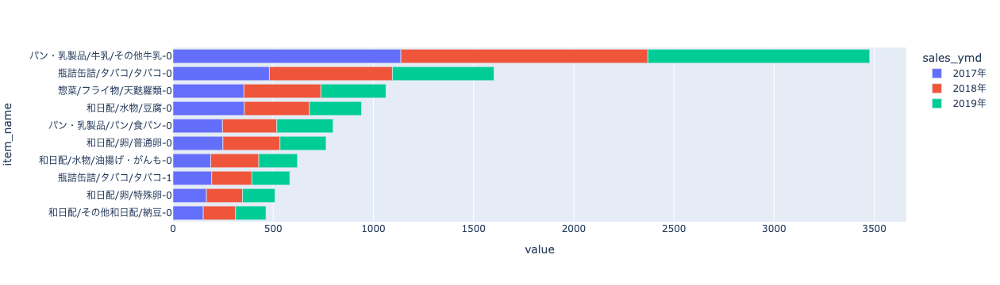

In [39]:
quantity_cross_item.sort_values("合計").tail(TOPN).drop(columns="合計").plot.barh()

## 売り上げTOPN

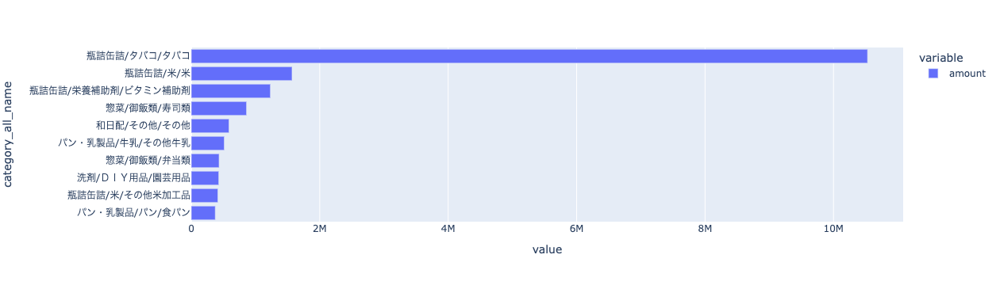

In [40]:
df_main.groupby("category_all_name").amount.sum().sort_values().tail(10).plot.barh()

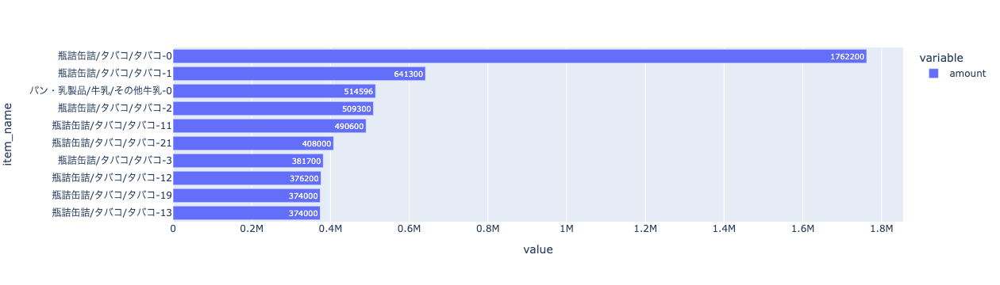

In [42]:
df_main.groupby("item_name").amount.sum().sort_values().tail(10).plot.barh(text="value")

In [43]:
amount_cross = pd.crosstab(
    index=df_main.category_all_name,
    columns=df_main.sales_ymd.dt.strftime("%Y年"),
    values=df_main.amount,
    aggfunc="sum"
)
amount_cross["合計"] = amount_cross.sum(axis=1)
amount_cross.head()

sales_ymd,2017年,2018年,2019年,合計
category_all_name,,,,
パン・乳製品/チルド食品/チルドデザート,9984.000,9588.000,10440.000,30012.000
パン・乳製品/チルド食品/チルド半製品,32896.000,28706.000,35438.000,97040.000
パン・乳製品/チルド食品/チルド調味料,8375.000,7800.000,7025.000,23200.000
パン・乳製品/デザート/その他デザート,28468.000,29588.000,28912.000,86968.000
パン・乳製品/デザート/ゼリー,15808.000,16700.000,15244.000,47752.000


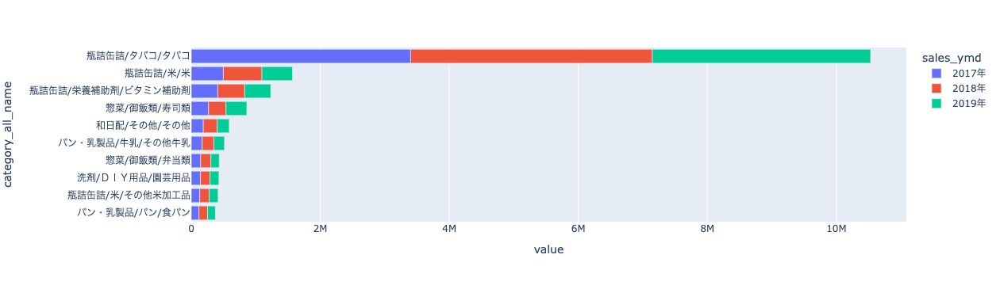

In [44]:
TOPN = 10
amount_cross.sort_values("合計").tail(TOPN).drop(columns="合計").plot.barh()

In [45]:
# main_df.pivot_tableでも可能
amount_cross_item = pd.crosstab(
    index=df_main.item_name,
    columns=df_main.sales_ymd.dt.strftime("%Y年"),
    values=df_main.amount,
    aggfunc="sum"
)
amount_cross_item["合計"] = amount_cross_item.sum(axis=1)
amount_cross_item.head()

sales_ymd,2017年,2018年,2019年,合計
item_name,,,,
パン・乳製品/チルド食品/チルドデザート-0,2964.000,2184.000,3198.000,8346.000
パン・乳製品/チルド食品/チルドデザート-1,1092.000,1638.000,1872.000,4602.000
パン・乳製品/チルド食品/チルドデザート-2,780.000,1014.000,1014.000,2808.000
パン・乳製品/チルド食品/チルドデザート-3,2178.000,2772.000,1980.000,6930.000
パン・乳製品/チルド食品/チルドデザート-4,2970.000,1980.000,2376.000,7326.000


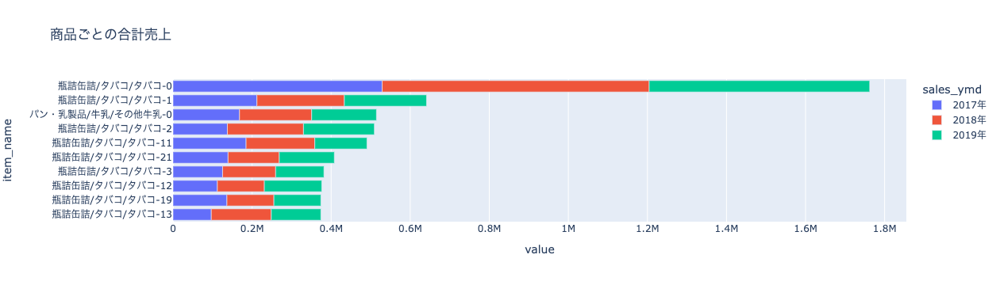

In [46]:
amount_cross_item.sort_values("合計").tail(TOPN).drop(columns="合計").plot.barh(title="商品ごとの合計売上")

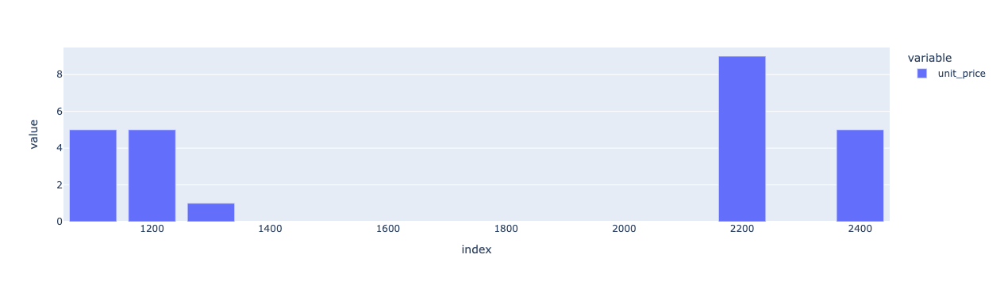

In [47]:
df_product.query("category_all_name.str.contains('タバコ')").unit_price.value_counts().plot.bar()

## タバコとよく一緒に売れる商品は？

In [48]:
df_main.head()

,sales_ymd,store_cd,customer_id,product_cd,quantity,amount,category_small_cd,unit_price,unit_cost,unit_profit,unit_profit_rate,category_all_name,item_name
0,2018-11-03,S14006,CS006214000001,P070305012,1,158,070305,158.000,119.000,39.000,0.247,瓶詰缶詰/和風調味料/砂糖・甘味料,瓶詰缶詰/和風調味料/砂糖・甘味料-11
1,2018-11-18,S13008,CS008415000097,P070701017,1,81,070701,81.000,61.000,20.000,0.247,瓶詰缶詰/即席加工品/即席袋めん,瓶詰缶詰/即席加工品/即席袋めん-16
2,2017-07-12,S14028,CS028414000014,P060101005,1,170,060101,170.000,128.000,42.000,0.247,パン・乳製品/パン/食パン,パン・乳製品/パン/食パン-4
3,2019-02-05,S14042,ZZ000000000000,P050301001,1,25,050301,25.000,19.000,6.000,0.240,和日配/生麺/生うどん,和日配/生麺/生うどん-0
4,2018-08-21,S14025,CS025415000050,P060102007,1,90,060102,90.000,63.000,27.000,0.300,パン・乳製品/パン/菓子パン,パン・乳製品/パン/菓子パン-6


In [74]:
item_cooc_df = df_main.groupby(["customer_id", "sales_ymd", "store_cd"]).category_all_name.unique().str.join(" ").reset_index()
item_cooc_df.head()

,customer_id,sales_ymd,store_cd,category_all_name
0,CS001113000004,2019-03-08,S13001,瓶詰缶詰/飲料/果汁・清涼飲料 瓶詰缶詰/タバコ/タバコ
1,CS001114000005,2018-05-03,S13001,菓子/珍味/漬物珍味 瓶詰缶詰/農産乾物/粉類
2,CS001114000005,2019-07-31,S13001,和日配/水物/豆腐 瓶詰缶詰/和風調味料/醤油
3,CS001115000010,2017-12-28,S13001,瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/飲料/果汁・清涼飲料
4,CS001115000010,2018-07-01,S13001,瓶詰缶詰/コーヒー・お茶/インスタントコーヒー 瓶詰缶詰/農産乾物/粉類


In [ ]:
from collections import 

In [84]:
item_cooc_df.query("category_all_name.str.contains('タバコ')").category_all_name.sum().split(" ")

'瓶詰缶詰/飲料/果汁・清涼飲料 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/飲料/果汁・清涼飲料瓶詰缶詰/農産乾物/乾燥豆類 瓶詰缶詰/タバコ/タバコ惣菜/御飯類/弁当類 瓶詰缶詰/タバコ/タバコ洗剤/口中衛生用品/歯磨き 瓶詰缶詰/タバコ/タバコパン・乳製品/牛乳/その他牛乳 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/米/米瓶詰缶詰/タバコ/タバコ 和日配/練物/野焼菓子/スナック/その他スナック 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 和日配/卵/特殊卵パン・乳製品/牛乳/その他牛乳 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/即席加工品/即席スープ類パン・乳製品/冷菓/パーソナルアイス 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 和日配/その他和日配/納豆瓶詰缶詰/タバコ/タバコ 和日配/練物/その他蒲鉾瓶詰缶詰/タバコ/タバコパン・乳製品/パン/菓子パン 瓶詰缶詰/タバコ/タバコパン・乳製品/パン/その他パン 瓶詰缶詰/タバコ/タバコ洗剤/口中衛生用品/歯磨き 瓶詰缶詰/タバコ/タバコ菓子/珍味/水産珍味 瓶詰缶詰/タバコ/タバコ菓子/ポケット物/ガム 瓶詰缶詰/タバコ/タバコ惣菜/フライ物/天麩羅類 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/缶・瓶詰/フルーツ缶詰菓子/珍味/水産珍味 瓶詰缶詰/タバコ/タバコ洗剤/家庭雑貨/家庭消耗雑貨 瓶詰缶詰/タバコ/タバコ惣菜/御飯類/寿司類 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 和日配/その他/その他瓶詰缶詰/タバコ/タバコ 瓶詰缶詰/栄養補助剤/カルシウム補助剤瓶詰缶詰/タバコ/タバコ 洗剤/衛生紙用品/ちり紙・京花紙パン・乳製品/デザート/その他デザート 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ瓶詰缶詰/飲料/水 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 和日配/その他/その他瓶詰缶詰/タバコ/タバコ パン・乳製品/パン/食パン瓶詰缶詰/缶・瓶詰/その他缶瓶詰め 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ パン・乳製品/パン/菓子パン瓶詰缶詰/栄養補助剤/ビタミン補助剤 瓶詰缶詰/タバコ/タバコ瓶詰缶詰/タバコ/タバコ 惣菜/フライ物/天麩羅類洗剤/ＤＩＹ用品/建築・塗

In [60]:
item_cooc_df.item_name[0]

array(['瓶詰缶詰/飲料/果汁・清涼飲料-11', '瓶詰缶詰/タバコ/タバコ-8'], dtype=object)

### 売り上げは伸びているのか？

In [59]:
df_sales = df_receipt.set_index("sales_ymd").resample("M").amount.sum()
df_sales.head()

sales_ymd
2017-01-31    902056
2017-02-28    764413
2017-03-31    962945
2017-04-30    847566
2017-05-31    884010
Freq: M, Name: amount, dtype: int64

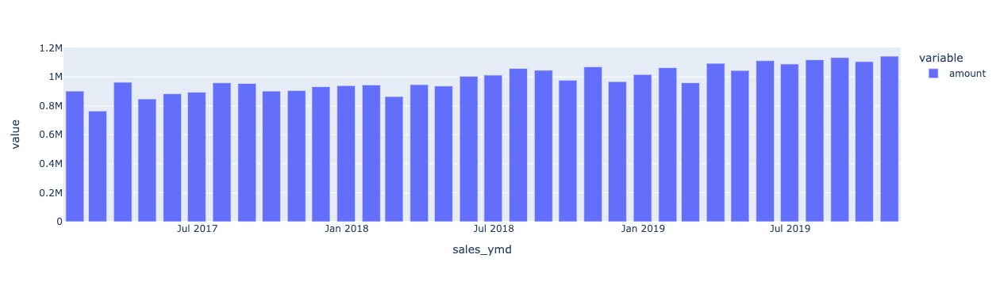

In [63]:
df_sales.plot.bar()

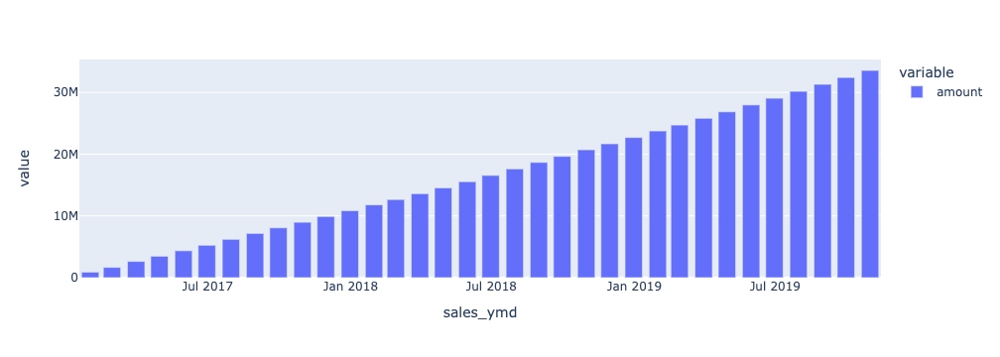

In [62]:
df_sales.cumsum().plot.bar()

In [224]:
df_store.head()

,store_cd,store_name,prefecture_cd,prefecture,address,address_kana,tel_no,longitude,latitude,floor_area
0,S12014,千草台店,12,千葉県,千葉県千葉市稲毛区千草台一丁目,チバケンチバシイナゲクチグサダイイッチョウメ,043-123-4003,140.1180,35.6356,1698.0000
1,S13002,国分寺店,13,東京都,東京都国分寺市本多二丁目,トウキョウトコクブンジシホンダニチョウメ,042-123-4008,139.4802,35.7057,1735.0000
2,S14010,菊名店,14,神奈川県,神奈川県横浜市港北区菊名一丁目,カナガワケンヨコハマシコウホククキクナイッチョウメ,045-123-4032,139.6326,35.5005,1732.0000
3,S14033,阿久和店,14,神奈川県,神奈川県横浜市瀬谷区阿久和西一丁目,カナガワケンヨコハマシセヤクアクワニシイッチョウメ,045-123-4043,139.4961,35.4592,1495.0000
4,S14036,相模原中央店,14,神奈川県,神奈川県相模原市中央二丁目,カナガワケンサガミハラシチュウオウニチョウメ,042-123-4045,139.3716,35.5733,1679.0000


In [243]:
df_receipt.merge(df_store[["store_cd", "prefecture"]]).groupby("prefecture").amount.sum()

prefecture
千葉県       3630584
東京都      16339964
神奈川県    13586002
Name: amount, dtype: int64

In [249]:
df_sales = df_receipt.merge(df_store[["store_cd", "prefecture"]])

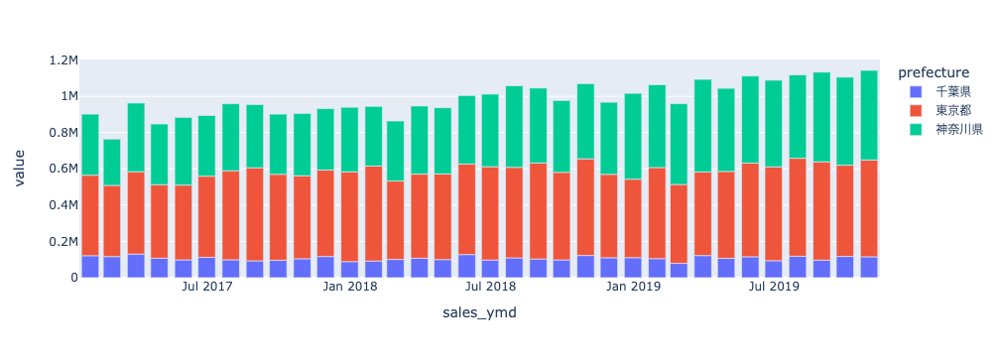

In [248]:
df_sales = df_receipt.merge(df_store[["store_cd", "prefecture"]])
df_sales = df_sales.groupby("prefecture").apply(lambda g: g.set_index("sales_ymd").resample("M").amount.sum())
df_sales.T.plot.bar()
# df_sales.plot.bar(x="sales_ymd", y="amount", color="store_cd", barmode="stack")

### デシル分析

In [146]:
set(df_receipt.customer_id.unique()) - set(df_customer.customer_id.unique())


{'ZZ000000000000'}

In [71]:
df_decyl = df_customer.merge(
    df_receipt.groupby("customer_id").amount.sum().reset_index(),
    how="left", on="customer_id"
).fillna({"amount": 0})
df_decyl.head()

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation,amount
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,20150905,0-00000000-0,30代,0.000
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,20150414,0-00000000-0,60代,0.000
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,20150529,D-20100325-C,40代,5088.000
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,20160115,0-00000000-0,80代,0.000
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,20170605,6-20090929-2,20代,875.000


In [127]:
pd.qcut(df_decyl.amount, q=9,labels=False, duplicates="drop")

0    14651
3     2442
2     2441
1     2437
Name: amount, dtype: int64

In [101]:
df_decyl["decyl_rank"] = 10
df_decyl.loc[df_decyl.amount > 0, "decyl_rank"] = 9 - pd.qcut(df_decyl.query("amount > 0").amount, q=9,labels=False)
df_decyl.head()

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation,amount,decyl_rank
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,20150905,0-00000000-0,30代,0.000,10
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,20150414,0-00000000-0,60代,0.000,10
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,20150529,D-20100325-C,40代,5088.000,2
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,20160115,0-00000000-0,80代,0.000,10
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,20170605,6-20090929-2,20代,875.000,6


In [121]:
df_decyl_sum = df_decyl.groupby("decyl_rank").agg({"amount": ["count", "sum"]})
df_decyl_sum.columns = ["_".join(t) for t in df_decyl_sum.columns]
df_decyl_sum["amount_sum_rate"] = df_decyl_sum.amount_sum/ df_decyl_sum.amount_sum.sum()
df_decyl_sum["amt_comsum_rate"] = df_decyl_sum.amount_sum_rate.cumsum()
df_decyl_sum["amt_per_user"] = df_decyl_sum.amount_sum / df_decyl_sum.amount_count
df_decyl_sum

,amount_count,amount_sum,amount_sum_rate,amt_comsum_rate,amt_per_user
decyl_rank,,,,,
1,923,7947311.000,0.376,0.376,8610.304
2,922,4518529.000,0.214,0.589,4900.791
3,924,3087264.000,0.146,0.735,3341.195
4,923,2145367.000,0.101,0.836,2324.341
5,922,1385064.000,0.065,0.902,1502.239
6,920,911890.000,0.043,0.945,991.185
7,924,577329.000,0.027,0.972,624.815
8,922,368073.000,0.017,0.990,399.211
9,926,220720.000,0.010,1.000,238.359


In [118]:
df_decyl_sum.amount_sum_rate.cumsum()

decyl_rank
1    0.376
2    0.589
3    0.735
4    0.836
5    0.902
6    0.945
7    0.972
8    0.990
9    1.000
10   1.000
Name: amount_sum_rate, dtype: float64

In [113]:
df_decyl_sum.amount_sum.sum()

21161547.0

In [191]:
df_decyl["buy_flg"] =  np.where(df_decyl.amount != 0, 1, 0)
df_decyl.head()

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation,amount,buy_flg
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,2015-09-05,0-00000000-0,30代,0.0000,0
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,2015-04-14,0-00000000-0,60代,0.0000,0
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,2015-05-29,D-20100325-C,40代,5088.0000,1
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,2016-01-15,0-00000000-0,80代,0.0000,0
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,2017-06-05,6-20090929-2,20代,875.0000,1


In [131]:
df_decyl["application_date"] = pd.to_datetime(df_decyl.application_date.astype("str"))
df_decyl.head()

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation,amount,decyl_rank
0,CS021313000114,大野 あや子,1,女性,1981-04-29,37,259-1113,神奈川県伊勢原市粟窪**********,S14021,2015-09-05,0-00000000-0,30代,0.000,10
1,CS037613000071,六角 雅彦,9,不明,1952-04-01,66,136-0076,東京都江東区南砂**********,S13037,2015-04-14,0-00000000-0,60代,0.000,10
2,CS031415000172,宇多田 貴美子,1,女性,1976-10-04,42,151-0053,東京都渋谷区代々木**********,S13031,2015-05-29,D-20100325-C,40代,5088.000,2
3,CS028811000001,堀井 かおり,1,女性,1933-03-27,86,245-0016,神奈川県横浜市泉区和泉町**********,S14028,2016-01-15,0-00000000-0,80代,0.000,10
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,2017-06-05,6-20090929-2,20代,875.000,6


In [141]:
df_decyl.query("application_date >= '2017-01-01'")

,customer_id,customer_name,gender_cd,gender,birth_day,age,postal_cd,address,application_store_cd,application_date,status_cd,generation,amount,decyl_rank
4,CS001215000145,田崎 美紀,1,女性,1995-03-29,24,144-0055,東京都大田区仲六郷**********,S13001,2017-06-05,6-20090929-2,20代,875.000,6
18,CS046615000013,河野 花,1,女性,1953-04-06,65,224-0026,神奈川県横浜市都筑区南山田町**********,S14046,2018-12-07,0-00000000-0,60代,0.000,10
25,CS011312000159,薬師丸 早紀,1,女性,1980-04-09,38,211-0034,神奈川県川崎市中原区井田中ノ町**********,S14011,2017-08-24,0-00000000-0,30代,0.000,10
26,CS004613000404,堀越 サンタマリア,1,女性,1951-04-11,67,165-0035,東京都中野区白鷺**********,S13004,2017-04-18,0-00000000-0,60代,0.000,10
38,CS001212000098,菊地 りえ,9,不明,1995-01-19,24,210-0842,神奈川県川崎市川崎区渡田東町**********,S13001,2017-06-04,3-20090405-2,20代,383.000,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21961,CS012415000309,高田 ひろ子,1,女性,1976-02-03,43,231-0831,神奈川県横浜市中区矢口台**********,S14012,2018-01-31,0-00000000-0,40代,0.000,10
21963,CS001315000402,豊島 路子,1,女性,1987-01-16,32,144-0052,東京都大田区蒲田**********,S13001,2017-11-03,0-00000000-0,30代,0.000,10
21964,CS039313000173,ともさか 花,1,女性,1983-02-11,36,167-0032,東京都杉並区天沼**********,S13039,2017-09-01,0-00000000-0,30代,0.000,10
21965,CS042513000030,三宅 ヒカル,1,女性,1959-01-19,60,231-0865,神奈川県横浜市中区北方町**********,S14042,2018-11-14,0-00000000-0,60代,0.000,10


In [134]:
df_receipt.sales_ymd.agg(["min", "max"])

min   2017-01-01
max   2019-10-31
Name: sales_ymd, dtype: datetime64[ns]

In [189]:
%%time
for _ in range(1000):
    tmp = np.where(df_decyl.amount >= 0, 1, 0)

CPU times: user 76.3 ms, sys: 2.79 ms, total: 79.1 ms
Wall time: 76.6 ms


In [161]:
cs_pivot = df_decyl.pivot_table(index="generation", columns="gender", values="amount", aggfunc="sum")
cs_pivot

gender,不明,女性,男性
generation,,,
10代,4317.0000,149836.0000,1591.0000
20代,44328.0000,1363724.0000,72940.0000
30代,50441.0000,693047.0000,177322.0000
40代,483512.0000,9320791.0000,19355.0000
50代,342923.0000,6685192.0000,54320.0000
60代,71418.0000,987741.0000,272469.0000
70代,2427.0000,29764.0000,13435.0000
80代,5111.0000,262923.0000,46360.0000
90代,NaN,6260.0000,0.0000


In [168]:
cs_pivot / cs_pivot_cnt

gender,不明,女性,男性
generation,,,
10代,479.6667,1040.5278,106.0667
20代,852.4615,1321.4380,663.0909
30代,268.3032,221.1382,418.2123
40代,1678.8611,1911.5650,25.5007
50代,1224.7250,1537.8864,68.0702
60代,482.5541,390.2572,574.8291
70代,26.0968,20.1244,43.4790
80代,365.0714,710.6027,515.1111
90代,NaN,1252.0000,0.0000


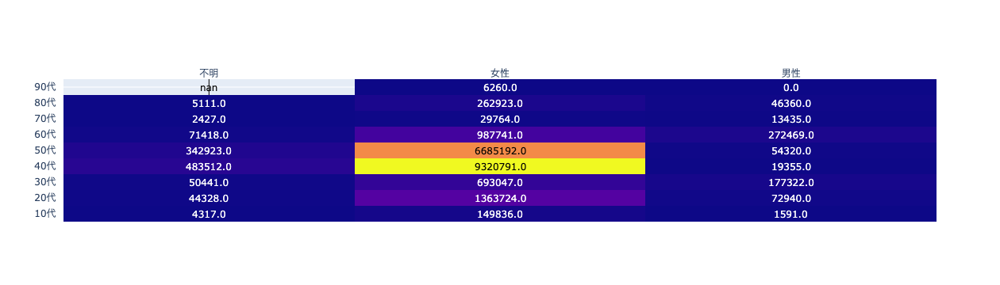

In [163]:
ff.create_annotated_heatmap(
    cs_pivot.values.tolist(),
    x=cs_pivot.columns.to_list(),
    y=cs_pivot.index.to_list(),
)

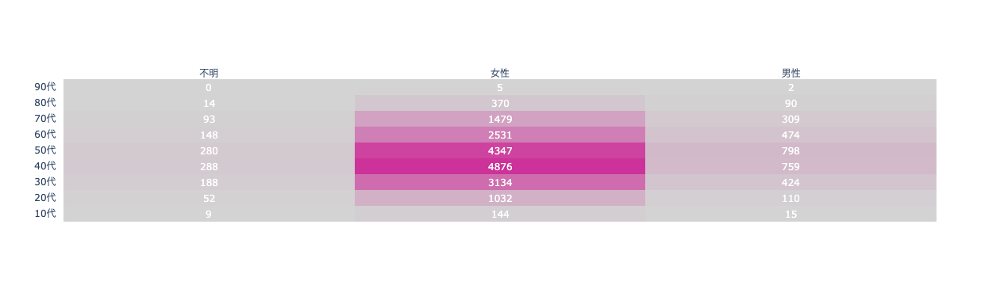

In [164]:
ff.create_annotated_heatmap(
    cs_cross.values.tolist(),
    x=cs_cross.columns.to_list(),
    y=cs_cross.index.to_list(),
    colorscale=[[0, "lightgray"], [1, "#CC3299"]],
    font_colors=["white"]
)

In [177]:
pd.qcut(df_customer.age, q=5, retbins=True)

(0        (10.999, 38.0]
 1          (64.0, 90.0]
 2          (38.0, 46.0]
 3          (64.0, 90.0]
 4        (10.999, 38.0]
               ...      
 21966      (54.0, 64.0]
 21967      (46.0, 54.0]
 21968      (38.0, 46.0]
 21969      (46.0, 54.0]
 21970    (10.999, 38.0]
 Name: age, Length: 21971, dtype: category
 Categories (5, interval[float64, right]): [(10.999, 38.0] < (38.0, 46.0] < (46.0, 54.0] < (54.0, 64.0] < (64.0, 90.0]],
 array([11., 38., 46., 54., 64., 90.]))